<a href="https://colab.research.google.com/github/tmq24/Digital-Image-Analysis-and-Processing/blob/main/Fourier_Series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
import gdown

In [ ]:
gdown.download('https://drive.google.com/uc?export=download&id=1YwT0FNTaZgJjUtvzSHOcIsbWfa2fs9eM', 'bridge.jpg', quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&id=1YwT0FNTaZgJjUtvzSHOcIsbWfa2fs9eM
To: /content/bridge.jpg
100%|██████████| 306k/306k [00:00<00:00, 52.5MB/s]


'bridge.jpg'

## Background - Fourier Series

The Fourier Transform is a mathematical tool used to decompose a signal into its frequency components. In the case of image processing, the Fourier Transform can be used to analyze the frequency content of an image, which can be useful for tasks such as image filtering and feature extraction. He stated that any periodic function could be expressed as a sum of infinite sines and cosines:

$
f(x) = \frac{a_0}{2} + \sum_{n=1}^\infty a_n \cos(nx) + \sum_{n=1}^\infty b_n \sin(nx)
$

[More detail about the formula here](#)

Fourier Transform is a generalization of the complex Fourier Series. In image processing, we use the discrete 2D Fourier Transform with formulas:

$
f(x, y) = \frac{1}{MN} \sum_{u=0}^{M-1} \sum_{v=0}^{N-1} F(u, v) \cdot e^{i 2 \pi \left( \frac{xu}{M} + \frac{yv}{N} \right)}
$

$
F(u, v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x, y) \cdot e^{-i 2 \pi \left( \frac{xu}{M} + \frac{yv}{N} \right)}
$


In [ ]:
fil_path = '/content'  # Base directory path for image files
imgbridge = 'bridge.jpg'  # Filename of the bridge image

In [ ]:
def ShowImage(ImageList, nRows=1, nCols=2, WidthSpace=0.00, HeightSpace=0.00):
    """
    Display a list of images in a grid layout using Matplotlib.

    Parameters:
        ImageList (list): List of images to be displayed.
        nRows (int): Number of rows in the grid layout. Default is 1.
        nCols (int): Number of columns in the grid layout. Default is 2.
        WidthSpace (float): Horizontal space between grid cells. Default is 0.00.
        HeightSpace (float): Vertical space between grid cells. Default is 0.00.
    """
    # Initialize a GridSpec object for the grid layout with specified rows and columns
    gs = gridspec.GridSpec(nRows, nCols)

    # Update the grid spacing with the provided width and height spacing
    gs.update(wspace=WidthSpace, hspace=HeightSpace)  # Adjust spacing between plots.

    # Set the figure size
    plt.figure(figsize=(20, 10))

    # Loop through the list of images
    for i in range(len(ImageList)):
        # Create a subplot for the current image using GridSpec
        ax1 = plt.subplot(gs[i])

        # Remove tick labels for a cleaner display
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])

        # Set the aspect ratio to 'equal' to preserve image dimensions
        ax1.set_aspect('equal')

        # Create another subplot using standard indexing
        plt.subplot(nRows, nCols, i + 1)

        # Copy the image to avoid modifying the original
        image = ImageList[i].copy()

        # Check if the image is grayscale (2D array)
        if len(image.shape) < 3:
            # Display grayscale image using the appropriate colormap
            plt.imshow(image, plt.cm.gray)
        else:
            # Display color image
            plt.imshow(image)

        # Add a title to the image, e.g., "Image 0", "Image 1", etc.
        plt.title("Image " + str(i))

        # Turn off axes for a cleaner display
        plt.axis('off')

    # Show all the images
    plt.show()


In [ ]:
def Image3Dto2D(image):
    """
    Convert a 3D image (color) to a 2D image (grayscale).

    Parameters:
        image (ndarray): Input image, which can be 2D (grayscale) or 3D (color).

    Returns:
        image_2D (ndarray): Grayscale image as a 2D array.
    """
    # Check if the image has at least 3 dimensions (color image)
    if len(image.shape) >= 3:
        # Convert the 3D color image to grayscale using OpenCV's cvtColor function
        image_2D = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        # If the image is already 2D (grayscale), create a copy of it
        image_2D = image.copy()

    return image_2D


In [ ]:
def DFT_Transformation(image):
    """
    Perform Discrete Fourier Transform (DFT) on an image and compute its magnitude spectrum.

    Parameters:
        image (ndarray): Input image, can be 2D (grayscale) or 3D (color).

    Returns:
        magnitude_spectrum (ndarray): The magnitude spectrum of the transformed image.
        dft_shift (ndarray): The shifted DFT result (frequency domain representation).
    """
    # Convert the image to 2D grayscale if it is a color image
    img = Image3Dto2D(image)

    # Convert the image to float32 format (required for DFT)
    img_float32 = np.float32(img)

    # Apply Discrete Fourier Transform (DFT) to the image
    dft = cv2.dft(img_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center of the frequency domain
    dft_shift = np.fft.fftshift(dft)

    # Compute the magnitude spectrum (log-scaled for visualization)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    return magnitude_spectrum, dft_shift


In [ ]:
def ApplyCenterSquareMask1(dft_shift, size,dim):
    """
    Apply a center square mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        size (int): Half the side length of the square mask to be applied.

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Set a center square to 1
    mask[crow - size:crow + size, ccol - size:ccol + size] = 1

    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * mask[:,:,dim]

    return masked_dft_shift, mask


In [ ]:
def ApplyCenterSquareMask2(dft_shift, size,dim):
    """
    Apply a center square mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        size (int): Half the side length of the square mask to be applied.

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Set a center square to 1
    mask[crow - size:crow + size, ccol - size:ccol + size] = 1
    mask = 1 -mask
    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * mask[:,:,dim]

    return masked_dft_shift, mask

In [ ]:
def InverseDFTWithMask(dft_shift, mask):
    """
    Apply a mask to the frequency domain representation of an image and perform an inverse DFT.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        mask (ndarray): The mask to apply in the frequency domain.

    Returns:
        image_inverse (ndarray): The reconstructed image in the spatial domain after applying the mask.
    """
    # Apply the mask to the frequency domain representation
    fshift = dft_shift * mask

    # Perform an inverse shift to move the zero-frequency component backv to its original position
    f_ishift = np.fft.ifftshift(fshift)

    # Perform the inverse Discrete Fourier Transform (IDFT)
    img_inverse = cv2.idft(f_ishift)

    # Compute the magnitude of the spatial domain representation
    image_inverse = cv2.magnitude(img_inverse[:, :, 0], img_inverse[:, :, 1])

    return image_inverse


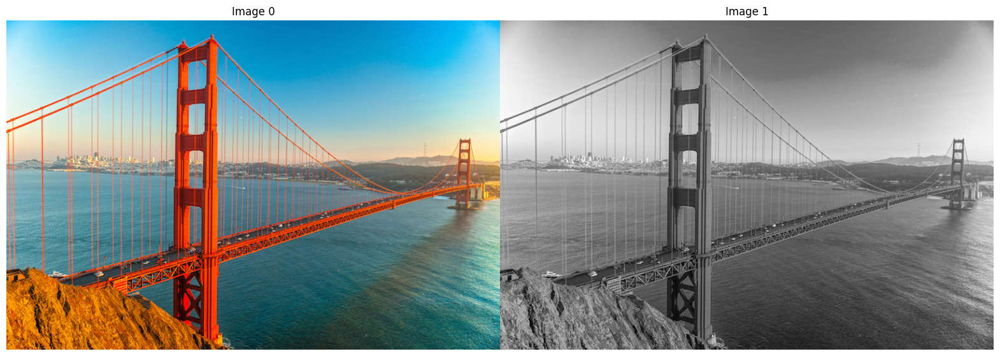

In [ ]:
# Read Image
image_color = imread(imgbridge)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

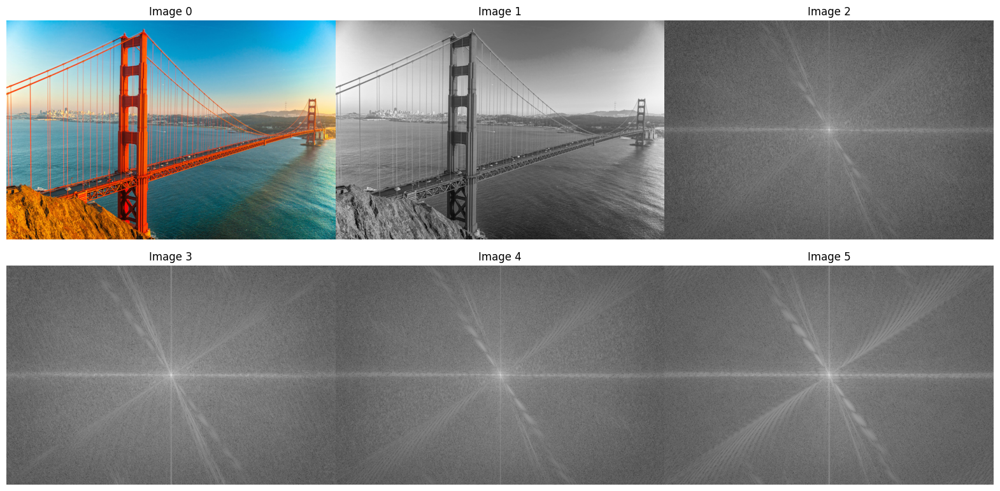

In [ ]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(image_color[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(image_color[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(image_color[:,:,2])
ShowImage([image_color, image_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

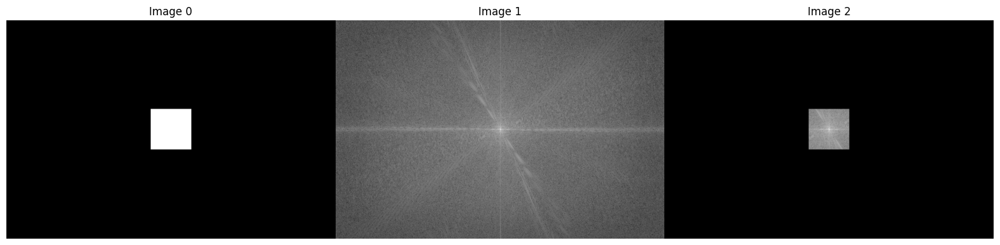

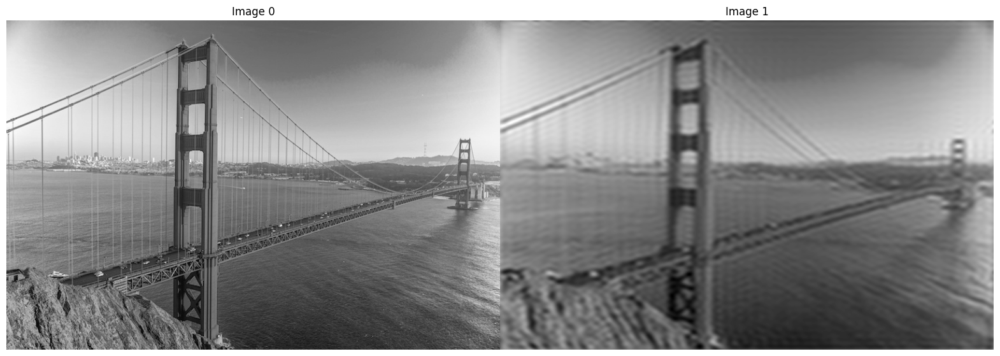

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros

image_dft_frequency_crop,mask = ApplyCenterSquareMask1(image_dft_frequency,size = 50,dim = 0)

# apply mask and inverse DFT

image_inverse = InverseDFTWithMask(dft_shift, mask)

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

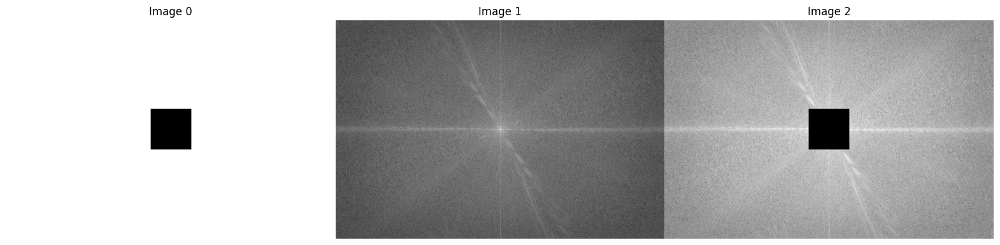

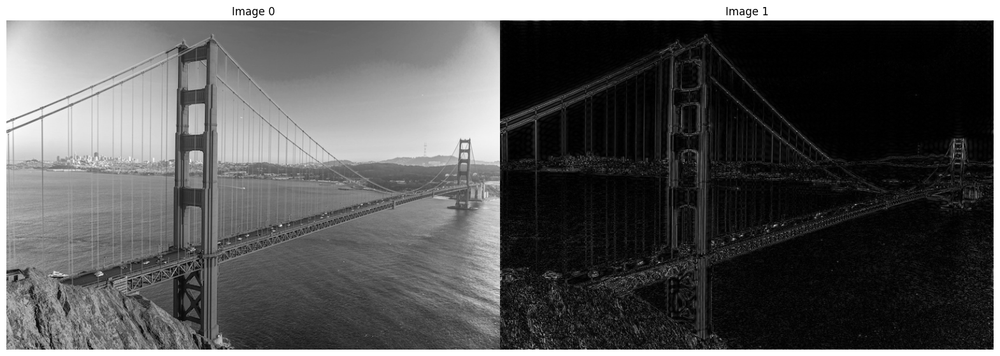

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
# mask = np.zeros((rows, cols, 2), np.uint8)
# size = 50
# mask[crow-size:crow+size, ccol-size:ccol+size] = 1
# image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

image_dft_frequency_crop,mask = ApplyCenterSquareMask2(image_dft_frequency,size = 50,dim = 0)

# apply mask and inverse DFT
# fshift = dft_shift*mask
# f_ishift = np.fft.ifftshift(fshift)
# img_inverse = cv2.idft(f_ishift)
# image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

image_inverse = InverseDFTWithMask(dft_shift, mask)

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

 # Theory Exercise

1) Explain the relationship between the spatial domain and the frequency domain in image processing.

2) List and explain the fundamental properties of the 2D Fourier Transform, including linearity, symmetry, shifting, and convolution.

3) Write the formula for the 2D Discrete Fourier Transform (DFT) of an image $ f(x, y) $ with dimensions $ M \times N $.  

4) Explain why, after performing the DFT, the low-frequency components are concentrated in the top-left corner of the frequency spectrum. How can the low-frequency components be shifted to the center?

5) Explain the significance of low-pass filters and high-pass filters in the frequency domain.  

6) For an image $ f(x, y) $, write the formula to apply a circular low-pass filter with a radius $ R $ in the frequency domain.

7) Describe a practical application of the Fourier Transform in image processing.

8) Define the Inverse Fourier Transform and write its mathematical formula.  

9) Given an image with a frequency spectrum $ F(u, v) $, explain how to reconstruct the original image $ f(x, y) $.

10) In the Fourier spectrum $ F(u, v) $, what is the significance of the phase and the magnitude?





### 1) **Explain the relationship between the spatial domain and the frequency domain in image processing.**
   - **Miền không gian** đề cập đến việc biểu diễn ảnh dưới dạng các giá trị pixel (giá trị cường độ hoặc màu sắc) tại các tọa độ cụ thể trong ảnh. Đây là cách chúng ta thường thấy và thao tác với ảnh.
   - **Miền tần số** lại biểu diễn ảnh dưới dạng các thành phần tần số của nó. Những thành phần này phản ánh sự thay đổi cường độ (hoặc màu sắc) trong ảnh qua các vị trí không gian. Biến đổi Fourier chuyển đổi ảnh từ miền không gian sang miền tần số, nơi mỗi điểm tương ứng với một tần số cụ thể trong ảnh.
   - Mối quan hệ là **miền không gian** chứa cả thông tin tần số cao và thấp, trong khi **miền tần số** tách biệt các tần số này. Các tần số thấp tương ứng với các vùng mượt mà trong ảnh, trong khi các tần số cao tương ứng với các chi tiết nhỏ hoặc các cạnh.
---

### 2) **List and explain the fundamental properties of the 2D Fourier Transform, including linearity, symmetry, shifting, and convolution.**
  - **Tính tuyến tính (Linearity):**
  - **Định nghĩa:** Biến đổi Fourier của tổng trọng số của hai hàm là tổng các biến đổi Fourier của từng hàm.
  - **Công thức:**
    $
    \mathcal{F}\{a f(x, y) + b g(x, y)\} = a \mathcal{F}\{f(x, y)\} + b \mathcal{F}\{g(x, y)\}
    $
  - **Ví dụ minh họa:**
    - Nếu $ f(x, y) = f_1(x, y) + f_2(x, y) $, thì $ F(u, v) = F_1(u, v) + F_2(u, v) $, trong đó $ F_1(u, v) $ và $ F_2(u, v) $ là Biến đổi Fourier của $ f_1(x, y) $ và $ f_2(x, y) $ tương ứng.

  - **Tính đối xứng (Symmetry):**
    - **Đối với hàm thực:**
      - Nếu $ f(x, y) $ là hàm thực, thì phổ tần số $ F(u, v) $ sẽ thỏa mãn:
        $
        F(-u, -v) = \overline{F(u, v)}
        $
        Trong đó $ \overline{F(u, v)} $ là liên hợp phức của $ F(u, v) $.
    - **Hàm chẵn:**
      - Nếu $ f(x, y) $ là hàm chẵn (symmetrical), thì phổ Fourier cũng sẽ đối xứng.
    - **Ví dụ minh họa:**
      - Nếu $ f(x, y) = f(-x, -y) $, thì $ F(u, v) = F(-u, -v) $.

  - **Tính dịch chuyển (Shifting):**
    - **Định nghĩa:** Dịch chuyển một hàm trong miền không gian tương ứng với việc nhân phổ Fourier của nó với một số phức.
    - **Công thức:**
      $
      \mathcal{F}\{f(x - x_0, y - y_0)\} = e^{-j2\pi \left( \frac{u x_0}{M} + \frac{v y_0}{N} \right)} \cdot F(u, v)
      $
    - **Ví dụ minh họa:**
      - Dịch chuyển ảnh $ f(x, y) $ sang phải $ x_0 $ pixel và xuống dưới $ y_0 $ pixel sẽ nhân phổ tần số của ảnh với $ e^{-j2\pi \left( \frac{u x_0}{M} + \frac{v y_0}{N} \right)} $.

  - **Tính chập (Convolution):**
    - **Định nghĩa:** Chập hai hàm trong miền không gian tương ứng với phép nhân các phổ Fourier của chúng trong miền tần số.
    - **Công thức:**
      $
      \mathcal{F}\{f(x, y) * g(x, y)\} = \mathcal{F}\{f(x, y)\} \cdot \mathcal{F}\{g(x, y)\}
      $
    - **Ví dụ minh họa:**
      - Khi chập hai ảnh $ f(x, y) $ và $ g(x, y) $, phổ tần số của kết quả sẽ là tích của phổ tần số của $ f $ và $ g $. Điều này thường được sử dụng trong việc áp dụng các bộ lọc tần số cho ảnh.
---

### 3) **Write the formula for the 2D Discrete Fourier Transform (DFT) of an image $ f(x, y) $ with dimensions $ M \times N $.**
  **Công thức Biến đổi Fourier rời rạc 2D (DFT)**

  $$ F(u, v) =  \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x, y) e^{-j 2 \pi \left( \frac{ux}{M} + \frac{vy}{N} \right)}
  $$

  **Trong đó:**
  - $ f(x, y) $: Giá trị cường độ sáng tại tọa độ $ (x, y)$ của ảnh gốc.
  - $ F(u, v) $: Giá trị phổ tần số tại tọa độ $ (u, v) $ trong không gian tần số.
  - $ M, N $: Kích thước ảnh (số điểm ảnh theo chiều ngang và dọc).
  -$ j $: Đơn vị ảo $j^2 = -1 $.
  - $ u, v $: Tọa độ trong miền tần số.

---
### 4) **Explain why, after performing the DFT, the low-frequency components are concentrated in the top-left corner of the frequency spectrum. How can the low-frequency components be shifted to the center?**
   - **Tại sao các thành phần tần số thấp tập trung ở góc trên bên trái?**
  - Trong DFT 2D, các tần số được sắp xếp từ $ 0 $ đến $ M-1 $ và $ 0 $ đến $ N-1 $ cho các trục $ u $ và $ v $ tương ứng.
  - Các giá trị $ u $ và $ v $ từ $ 0 $ đến $ \frac{M}{2} $ và $ 0 $ đến $ \frac{N}{2} $ đại diện cho các tần số dương.
  - Các giá trị từ $ \frac{M}{2} + 1 $ đến $ M-1 $ và từ $ \frac{N}{2} + 1 $ đến % N-1 % đại diện cho các tần số âm.
  - Do đó, các tần số thấp nằm gần góc $ (0, 0) $, tức là góc trên bên trái của phổ tần số.

- **Cách dịch chuyển các thành phần tần số thấp về trung tâm:**
  - Sử dụng hàm **`fftshift`**, một phép dịch tần số phổ biến trong các thư viện như NumPy hoặc MATLAB.
  - **`fftshift`** thực hiện việc hoán đổi các phần tư của phổ tần số, đưa các tần số thấp từ góc lên trên bên trái về trung tâm của phổ.
---
### 5) **Explain the significance of low-pass filters and high-pass filters in the frequency domain.**
  - **Bộ lọc thông thấp (Low-Pass Filter):**
    - **Ý nghĩa:**
      - Cho phép các thành phần tần số thấp (biến đổi mượt mà, quy mô lớn) đi qua và chặn các thành phần tần số cao (chi tiết nhỏ hoặc nhiễu).
    - **Ứng dụng:**
      - **Làm mịn ảnh:** Loại bỏ nhiễu và các chi tiết không mong muốn, giúp làm mềm các vùng mượt mà trong ảnh.
      - **Giảm nhiễu:** Loại bỏ các tần số cao thường liên quan đến nhiễu trong ảnh.
    - **Các loại bộ lọc thông thấp:**
      - **Bộ lọc hình hộp (Ideal Low-Pass Filter):** Chặn hoàn toàn các tần số trên một ngưỡng nhất định $ R $.
      - **Bộ lọc Gaussian (Gaussian Low-Pass Filter):** Giảm dần biên độ của các tần số cao theo hàm Gaussian, tạo ra hiệu ứng làm mịn tự nhiên.
      - **Bộ lọc Butterworth (Butterworth Low-Pass Filter):** Cung cấp sự chuyển tiếp mượt mà giữa các tần số thấp và cao, giảm hiện tượng dao động mạnh.

  - **Bộ lọc thông cao (High-Pass Filter):**
    - **Ý nghĩa:**
      - Cho phép các thành phần tần số cao (các cạnh và chi tiết) đi qua và chặn các thành phần tần số thấp (biến đổi mượt mà).
    - **Ứng dụng:**
      - **Phát hiện biên cạnh:** Xác định các viền và chi tiết nhỏ trong ảnh bằng cách tăng cường các tần số cao.
      - **Tăng cường chi tiết:** Làm nổi bật các chi tiết nhỏ và các kết cấu phức tạp trong ảnh.
    - **Các loại bộ lọc thông cao:**
      - **Bộ lọc hình hộp (Ideal High-Pass Filter):** Chặn hoàn toàn các tần số dưới một ngưỡng nhất định $ R $.
      - **Bộ lọc Gaussian (Gaussian High-Pass Filter):** Tương tự như bộ lọc thông thấp Gaussian nhưng ngược lại, làm giảm dần các tần số thấp.
      - **Bộ lọc Butterworth (Butterworth High-Pass Filter):** Cung cấp sự chuyển tiếp mượt mà giữa các tần số cao và thấp.

  - **Ví dụ ứng dụng cụ thể:**
    - **Làm mịn ảnh (Low-Pass):** Sử dụng bộ lọc Gaussian thông thấp để giảm nhiễu trong ảnh y tế trước khi phân tích.
    - **Phát hiện biên cạnh (High-Pass):** Sử dụng bộ lọc Butterworth thông cao để xác định các biên cạnh trong ảnh kỹ thuật số phục vụ cho việc nhận dạng đối tượng.

---
### 6) **For an image $ f(x, y) $, write the formula to apply a circular low-pass filter with a radius $ R $ in the frequency domain.**
   Để áp dụng một **bộ lọc thông thấp tròn** có bán kính $ R $ trong miền tần số đối với ảnh $ f(x, y) $, bộ lọc $ H(u, v) $ trong miền tần số được định nghĩa như sau:
   $$
   H(u, v) = \begin{cases}
   1, & \text{nếu } \sqrt{u^2 + v^2} \leq R \\
   0, & \text{nếu } \sqrt{u^2 + v^2} > R
   \end{cases}
   $$
   Bộ lọc này cho phép các thành phần tần số nằm trong vùng tròn có bán kính $ R $ đi qua và chặn các thành phần tần số khác.
---
### 7) **Describe a practical application of the Fourier Transform in image processing.**
  **Phát hiện cạnh biên bằng Biến đổi Fourier**

  **Các bước thực hiện:**

  1. **Chuyển đổi ảnh sang miền tần số:**
    - **Biến đổi Fourier:** Đầu tiên, thực hiện Biến đổi Fourier (DFT) trên ảnh gốc để chuyển từ miền không gian sang miền tần số. Kết quả là một phổ tần số $ F(u, v) $ chứa các thành phần tần số của ảnh.
    - **Dịch chuyển phổ tần số:** Sử dụng phép `fftshift` để dịch chuyển các thành phần tần số thấp về trung tâm của phổ tần số. Điều này giúp dễ dàng xác định và xử lý các tần số cần thiết cho việc lọc.

  2. **Áp dụng bộ lọc thông cao:**
    - **Thiết kế bộ lọc thông cao:** Tạo một bộ lọc thông cao $ H(u, v) $ trong miền tần số. Bộ lọc này sẽ cho phép các thành phần tần số cao (liên quan đến các biên cạnh và chi tiết nhỏ) đi qua và chặn các thành phần tần số thấp (liên quan đến các biến đổi mượt mà và nền).
    - **Áp dụng bộ lọc:** Nhân phổ tần số đã được dịch chuyển $ F_{shifted}(u, v) $ với bộ lọc thông cao $ H(u, v) $ để loại bỏ các tần số thấp không mong muốn:
      $
      G(u, v) = F_{shifted}(u, v) \cdot H(u, v)
      $

  3. **Chuyển đổi trở lại miền không gian:**
    - **Dịch ngược phổ tần số:** Sử dụng phép `ifftshift` để dịch ngược phổ tần số $ G(u, v) $ trở lại vị trí ban đầu.
    - **Biến đổi Fourier Ngược (IDFT):** Thực hiện Biến đổi Fourier Ngược (IDFT) trên $ G(u, v) $ để chuyển từ miền tần số trở lại miền không gian, thu được ảnh đã được tăng cường biên cạnh $ f_{edge}(x, y) $.

  4. **Xử lý kết quả:**
    - **Lấy phần thực của ảnh:** Kết quả IDFT thường là một ma trận phức. Lấy giá trị tuyệt đối hoặc phần thực của kết quả để có được ảnh biên cạnh rõ ràng.
    - **Chuẩn hóa ảnh (nếu cần):** Điều chỉnh độ sáng và tương phản của ảnh biên cạnh để dễ dàng quan sát và phân tích.
---
### 8) **Define the Inverse Fourier Transform and write its mathematical formula.**
  Định nghĩa
  Biến đổi Fourier Ngược (Inverse Fourier Transform - IFT) là phép biến đổi cho phép khôi phục tín hiệu hoặc hình ảnh từ miền tần số (frequency domain) về miền không gian (spatial domain).  

  Trong xử lý ảnh, nếu $F(u, v)$ là phổ tần số thu được từ Biến đổi Fourier (DFT), thì Biến đổi Fourier Ngược $f(x, y)$ sẽ khôi phục hình ảnh ban đầu.
   Công thức của nó là:
   $$
   f(x, y) = \frac{1}{MN} \sum_{u=0}^{M-1} \sum_{v=0}^{N-1} F(u, v) e^{j2\pi \left( \frac{ux}{M} + \frac{vy}{N} \right)}
   $$
   **Trong đó:**
  - $f(x, y)$: Ảnh gốc trong miền không gian.
  - $F(u, v)$: Phổ tần số (kết quả của DFT).
  - $M, N$: Kích thước của ảnh.
  - $e^{j 2\pi \left( \frac{ux}{M} + \frac{vy}{N} \right)}$: Thành phần pha phức.
  - $x, y$: Tọa độ trong miền không gian.
  - $u, v$: Tọa độ trong miền tần số.
---
### 9) **Given an image with a frequency spectrum $ F(u, v) $, explain how to reconstruct the original image $ f(x, y) $.**
  1. **Biến đổi Fourier ngược (IDFT)**:
  Công thức của Biến đổi Fourier ngược cho một ảnh 2D có dạng:

$$
F(u, v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x, y) \cdot e^{-i 2 \pi \left( \frac{xu}{M} + \frac{yv}{N} \right)}
$$

  2. **Lý thuyết**:
    - **Phổ tần số** $ F(u, v)$ đại diện cho các thành phần tần số của ảnh $ f(x, y) $. Các thành phần tần số này chứa thông tin về các biến đổi trong ảnh, chẳng hạn như các chi tiết và biên cạnh.
    - Biến đổi Fourier ngược sẽ kết hợp các thành phần tần số lại với nhau, sử dụng pha của mỗi thành phần, để tái tạo lại giá trị pixel của ảnh gốc.

  3. **Dịch tần số (nếu cần)**:
    - Sau khi thực hiện Biến đổi Fourier, các thành phần tần số thấp (liên quan đến biến đổi chậm trong ảnh) sẽ nằm ở góc trên bên trái của phổ. Nếu cần, ta có thể dịch các thành phần này về trung tâm bằng cách sử dụng `fftshift` .

  4. **Tái tạo ảnh**:
    - Sau khi áp dụng Biến đổi Fourier ngược, ta sẽ thu được ảnh $ f(x, y)  $ trong không gian. Ảnh này chính là ảnh gốc ban đầu (hoặc ảnh đã được thay đổi nếu có điều chỉnh trong phổ tần số).
---

### 10) **In the Fourier spectrum $ F(u, v) $, what is the significance of the phase and the magnitude?**
   - **Biên độ** $ |F(u, v)| $ đại diện cho cường độ của các thành phần tần số và cung cấp thông tin về độ tương phản và kết cấu chung của ảnh.
   - **Pha**  $ \angle F(u, v) $ chứa thông tin không gian về vị trí và cấu trúc của ảnh. Trong khi biên độ có thể cung cấp thông tin về sự xuất hiện chung, pha lại quan trọng hơn trong việc tái tạo cấu trúc không gian chính xác của ảnh.

   - Ý nghĩa tổng thể:
    - **Biên độ**: cho biết cường độ hay sức mạnh của các tần số có trong tín hiệu, cho phép ta xác định cấu trúc tổng thể và các thành phần tần số chính.   
    - **Pha**: cung cấp thông tin về vị trí và thời gian của các sóng, ảnh hưởng đến cách mà các tín hiệu tương tác với nhau.



#Practical Excise

- Convert the image to grayscale
- Perform DFT and display the image in the frequency domain
- Create a mask to remove the high-frequency domain and display the texture image.
- Create a mask to remove the low-frequency domain and display the edge image
-Create a circular mask with a radius $ r $, then apply it to the frequency domain as described above and output the resulting image.



## Convert the image to grayscale

Downloading...
From: https://drive.google.com/uc?id=1Gt3EaVta3Ea6NQfsaAaI7QYFaf1c9n1Z
To: /content/car.jpg
100%|██████████| 260k/260k [00:00<00:00, 59.9MB/s]


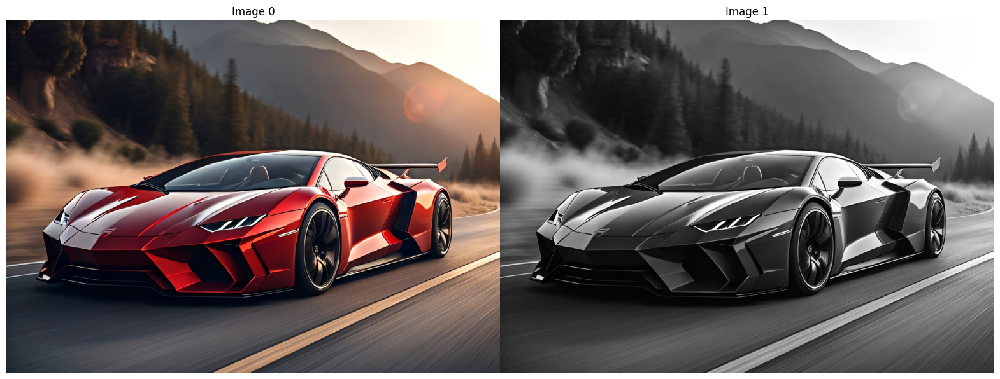

In [ ]:
gdown.download('https://drive.google.com/uc?id=1Gt3EaVta3Ea6NQfsaAaI7QYFaf1c9n1Z', 'car.jpg', quiet=False)

fil_path = '/content'
imgcar = 'car.jpg'

# Read Image
image_color = imread(imgcar)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

## Perform DFT and display the image in the frequency domain

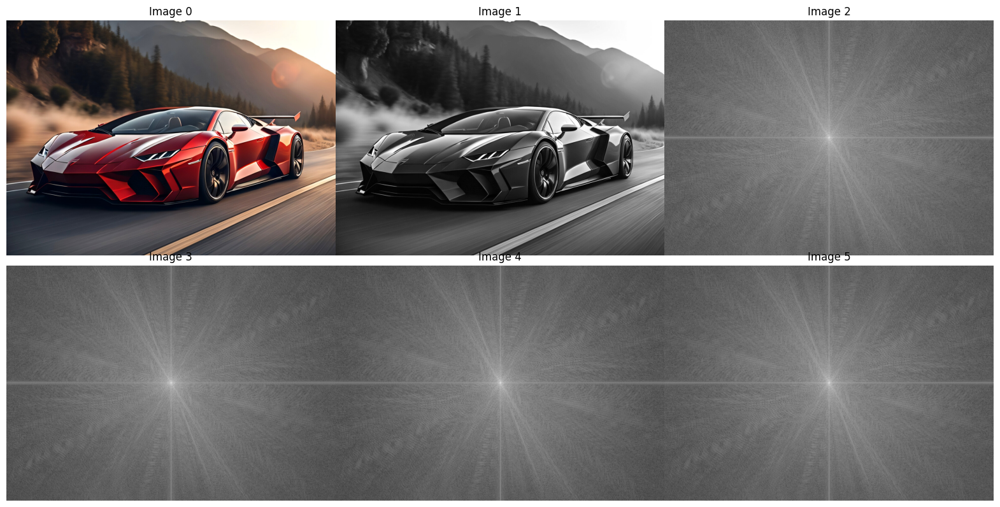

In [ ]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(image_color[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(image_color[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(image_color[:,:,2])
ShowImage([image_color, image_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

## Create a mask to remove the high-frequency domain and display the texture image.

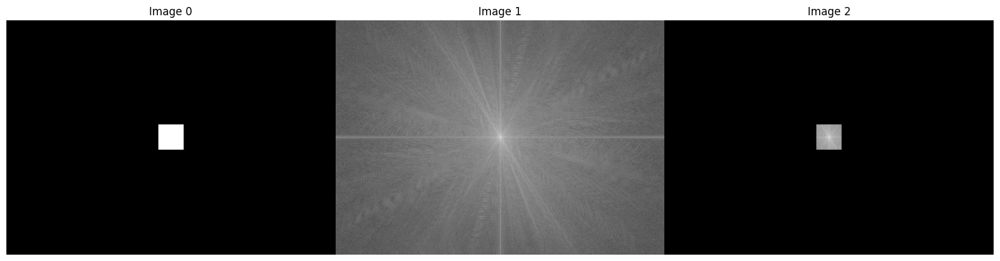

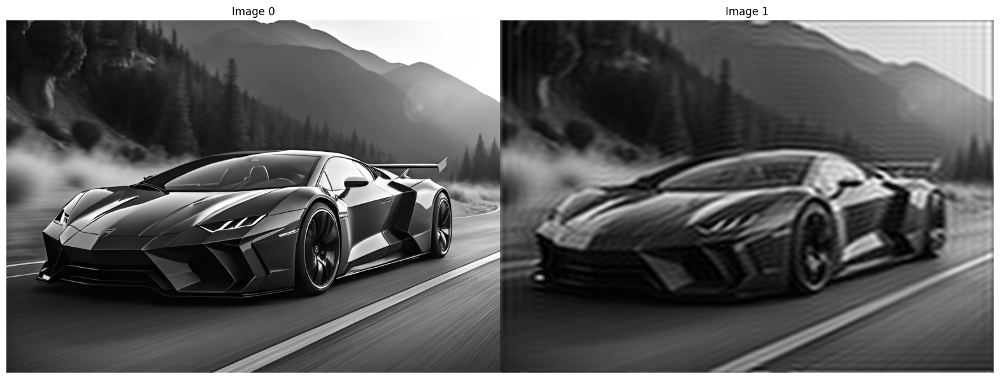

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros

image_dft_frequency_crop,mask = ApplyCenterSquareMask1(image_dft_frequency,size = 50,dim = 0)

# apply mask and inverse DFT

image_inverse = InverseDFTWithMask(dft_shift, mask)

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

## Create a mask to remove the low-frequency domain and display the edge image

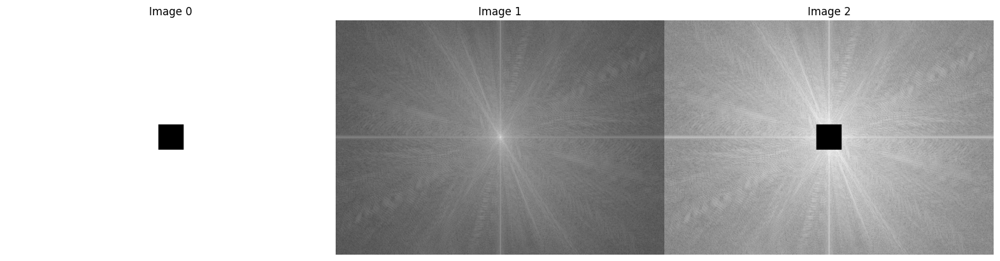

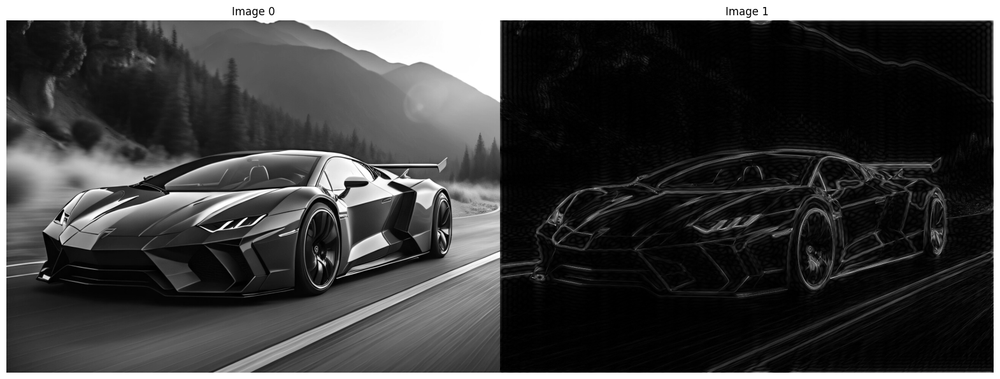

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
# mask = np.zeros((rows, cols, 2), np.uint8)
# size = 50
# mask[crow-size:crow+size, ccol-size:ccol+size] = 1
# image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

image_dft_frequency_crop,mask = ApplyCenterSquareMask2(image_dft_frequency,size = 50,dim = 0)

# apply mask and inverse DFT
# fshift = dft_shift*mask
# f_ishift = np.fft.ifftshift(fshift)
# img_inverse = cv2.idft(f_ishift)
# image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

image_inverse = InverseDFTWithMask(dft_shift, mask)

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

## Create a circular mask with a radius  r , then apply it to the frequency domain as described above and output the resulting image.

In [ ]:
def ApplyCircularMask(dft_shift, radius, high_pass=False):
    """
    Apply a circular mask to the frequency domain representation.

    Parameters:
        dft_shift (ndarray): The shifted DFT representation
        radius (int): Radius of the circular mask
        high_pass (bool): If True, creates a high-pass filter instead of low-pass

    Returns:
        masked_dft_shift (ndarray): Masked frequency domain representation
        mask (ndarray): The applied mask
    """
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2

    # Create a grid of coordinates
    y, x = np.ogrid[-crow:rows-crow, -ccol:cols-ccol]
    mask_area = x*x + y*y <= radius*radius

    # Create the mask
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[..., 0][mask_area] = 1
    mask[..., 1][mask_area] = 1

    if high_pass:
        mask = 1 - mask

    # Apply the mask
    masked_dft_shift = dft_shift * mask

    return masked_dft_shift, mask

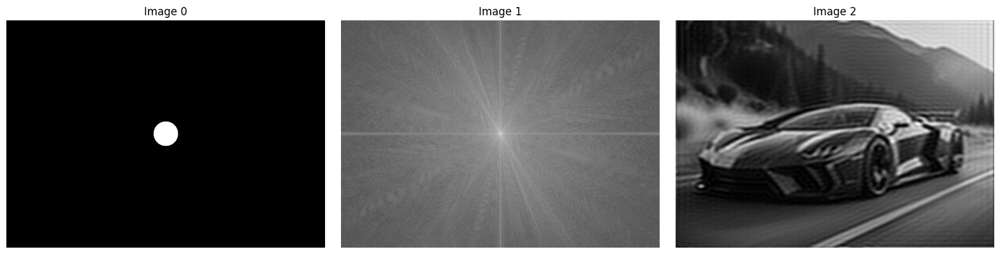

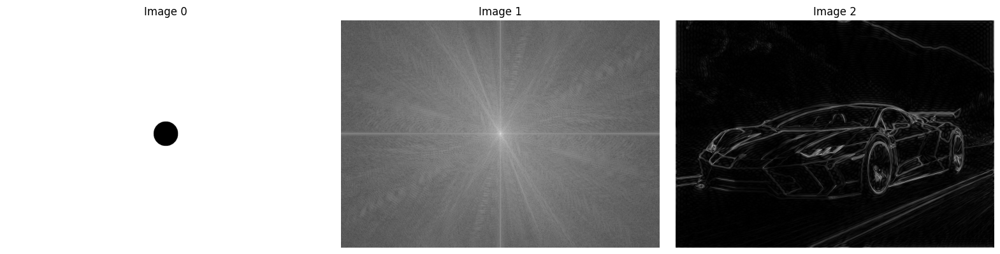

In [ ]:
# Áp dụng low-pass filter
radius_low = 50
lowpass_dft, lowpass_mask = ApplyCircularMask(dft_shift, radius_low, high_pass=False)
lowpass_image = InverseDFTWithMask(dft_shift, lowpass_mask)

# Áp dụng high-pass filter
radius_high = 50
highpass_dft, highpass_mask = ApplyCircularMask(dft_shift, radius_high, high_pass=True)
highpass_image = InverseDFTWithMask(dft_shift, highpass_mask)

# Hiển thị kết quả low-pass
ShowImage([lowpass_mask[:,:,0], image_dft_frequency, lowpass_image], 1, 3, WidthSpace=0.05)

# Hiển thị kết quả high-pass
ShowImage([highpass_mask[:,:,0], image_dft_frequency, highpass_image], 1, 3, WidthSpace=0.05)